<a href="https://colab.research.google.com/github/sahilnale/spotifydataset/blob/main/music_genre_classfication_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Music Genre Classification

<p align="center">
<img src="https://raw.githubusercontent.com/sahilnale/spotifydataset/main/5bbf2e37645d9f9b29464671b0b407f62535e556.jpg" width="1000">





### **About the Dataset**

This dataset provides comprehensive information about Spotify tracks encompassing a diverse collection of 125 genres. It has been compiled and cleaned using Spotify's Web API and Python. Presented in CSV format, this dataset is easily accessible and amenable to analysis. The dataset comprises multiple columns, each representing distinctive audio features associated with individual tracks.

The columns include: artists (the name of the artist or artists who performed the track), album_name (the title of the album to which the track belongs), track_name (the specific name of each track), popularity (a numerical score indicating the popularity of a song on Spotify ranging from 0 to 100), duration_ms (the duration of each track measured in milliseconds), explicit (a boolean value denoting whether a song contains explicit content or not).

Furthermore, there are various audio features that provide deep insights into the musical characteristics of each track. These features include danceability, energy, key, loudness, mode, speechiness (indicating whether spoken words are present in a song), acousticness (measuring how much a song leans towards acoustic sounds rather than electric ones), instrumentalness (indicating how likely it is for a song to be instrumental rather than vocal-oriented).

Additional audio attributes encompass liveness, reflecting the presence or absence of live audience elements within tracks; valence quantifying musical positiveness conveyed by a song; tempo denoting beats per minute; and time_signature revealing details about bar structures within tracks.

The dataset enables users to discern patterns across multiple genres while also facilitating genre prediction based on perceptible audio nuances derived through machine learning models.

Aspiring audiophiles, music enthusiasts,and data scientists can effectively harness this repository for research purposes—fostering extensive exploration into genre dynamics and comprehending nuanced relationships between various musical attributes featured in these Spotify masterpieces

## **Getting Started**

Import Dependencies

In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

Import dataset

In [ ]:
url = 'https://raw.githubusercontent.com/sahilnale/spotifydataset/main/train.csv'
df = pd.read_csv(url)

**Data Cleaning**
###### Most of the Data Cleaning has been done before hand for the dataset so very mininal work needs to be done

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

In [ ]:
#see number of entries with null rows by column
df.isnull().sum()

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [ ]:
#since only one row with null entries we can drop that row
df = df.dropna()

df.isnull().sum()

Unnamed: 0          0
track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

## Data Exploration

**Popularity**

Text(0.5, 1.0, 'Histogram of popularity of songs')

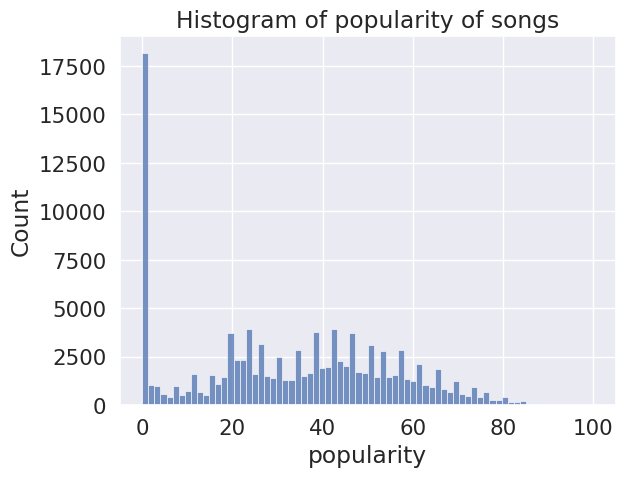

In [ ]:
sns.histplot(df['popularity']).set_title("Histogram of popularity of songs")

We see that the popularity of seems to be approximately normally distributed with the exception of the popularity score when it's zero where this is an overwhelming large number of obe:servations. This likely implies that most songs have no listeners or gain no popularity with only a very few getting any traction.

**Duration**

Median Value:3.5484333333333336


Text(0.5, 0, 'Duration (mins)')

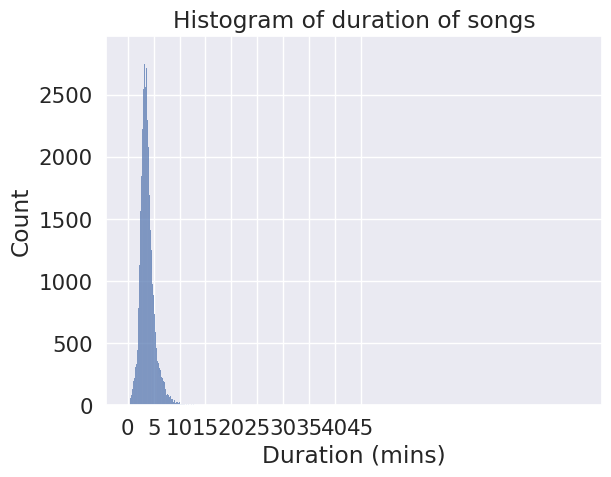

In [ ]:
duration_mins = df['duration_ms']/60000
print("Median Value:" + str(np.median(duration_mins)))

p = sns.histplot(duration_mins)

p.set_xticks([0,5,10,15,20,25,30,35,40,45])

p.set_title("Histogram of duration of songs")

p.set_xlabel("Duration (mins)")

Most of the songs are between 0 to 10 mins but there are a large number of outliers that lies outside of this range. We can see the the median duration of a song is in the 3.54 range and we are able to determine that the graph is skewed to the right.

**Energy**

<Axes: xlabel='energy', ylabel='Count'>

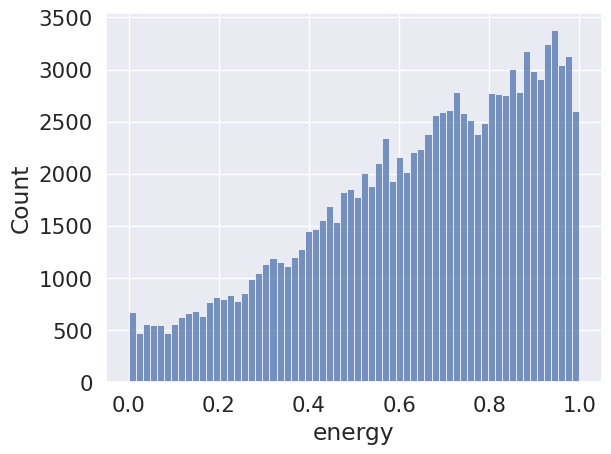

In [ ]:
sns.histplot(df['energy'])

The energy of a song is measured on the scale 0 to 1 where the distribution seems to be a left skewed distribution. The number of songs seems to increase as the energy of the song is more where songs with high energy are most prevalent and the songs with the least are the least prevalent.


**Loudness**

<Axes: xlabel='loudness', ylabel='Count'>

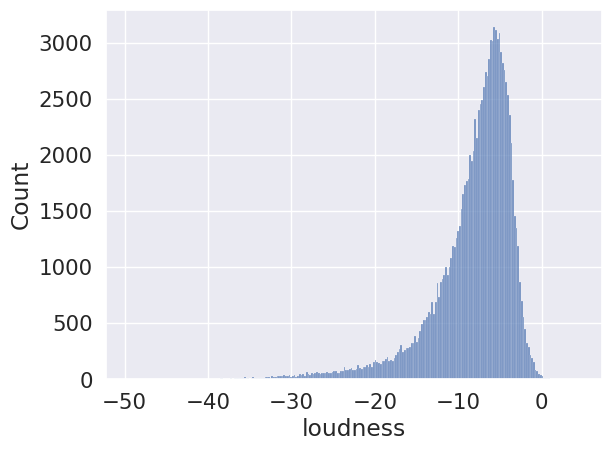

In [ ]:
sns.histplot(df['loudness'])

Loudness of songs seem to have a skewed to left distribution where mass majority of songs are between -20 and 0 on the loudness scale.

**Speechiness**

<Axes: xlabel='speechiness', ylabel='Count'>

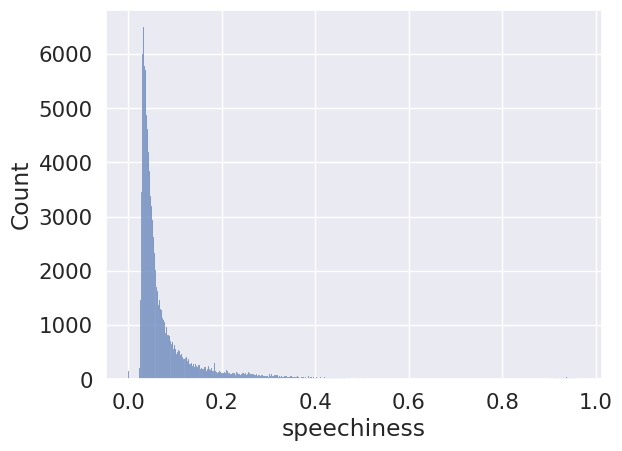

In [ ]:
sns.histplot(df['speechiness'])

Distribution of speachiness across songs is skewed to the right with most of them being between 0 to 0.2 while going all the way to 1 on the loudness scale.


**Acousticness**

<Axes: xlabel='acousticness', ylabel='Count'>

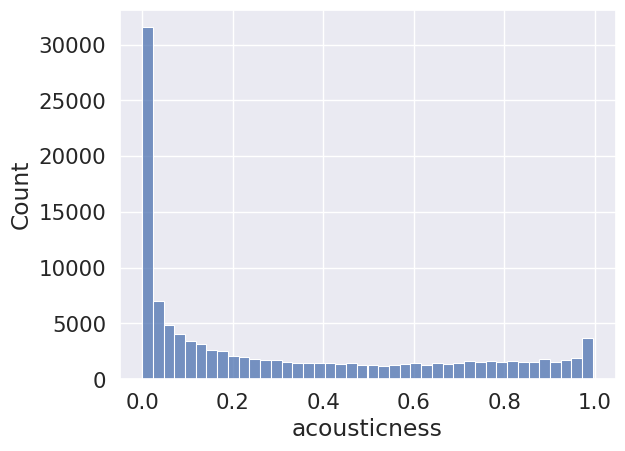

In [ ]:
sns.histplot(df['acousticness'])

The distrubtion of acousticness of songs is skewed to the right with  majority being 0 on the acoustiness scale and there being while it distrubution seems to be pretty uniform for the values between 0.2 to 0.9, while there is a slight uptick at 1 on the scale.

**Liveness**

<Axes: xlabel='liveness', ylabel='Count'>

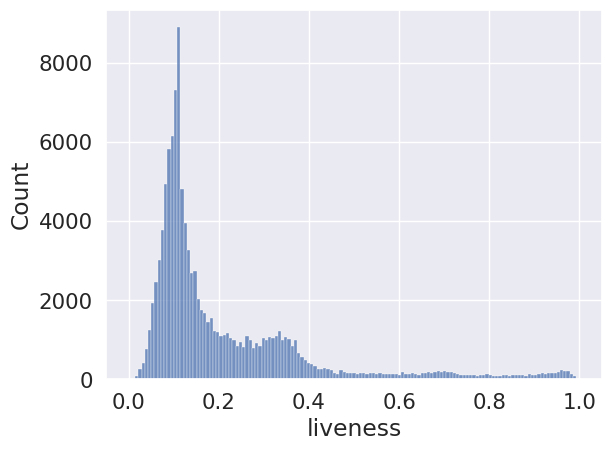

In [ ]:
sns.histplot(df['liveness'])

The distribution of Liveness is seems to be almost a bimodal distribution with a peak at around 0.1 and another on at 0.3 or could also be a right skewed distribution with most values between 0 and 0.


**Valence**

<Axes: xlabel='valence', ylabel='Count'>

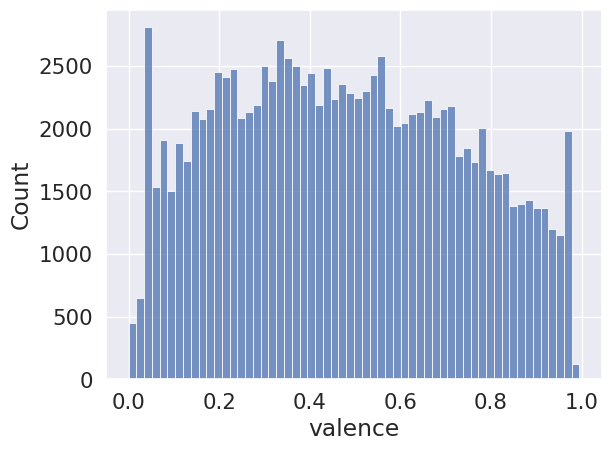

In [ ]:
sns.histplot(df['valence'])

Valence is very slight skewed to the right

**Tempo**

<Axes: xlabel='tempo', ylabel='Count'>

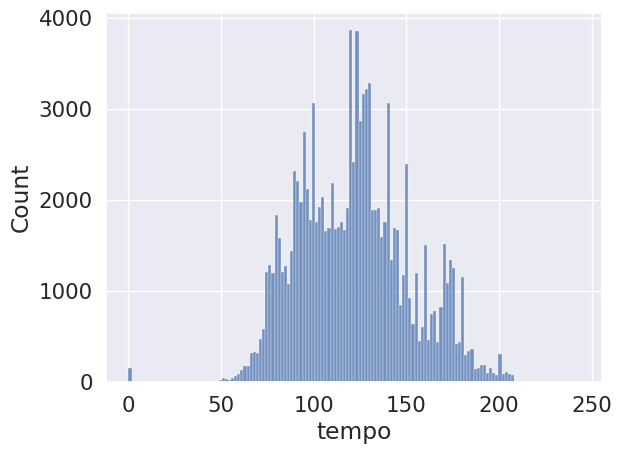

In [ ]:
sns.histplot(df['tempo'])

Tempo follows an approximately standard distribution with the peak being around 125 and most songs having a tempo between 50 and 200.

**Corrolation Heatmap**

<Axes: >

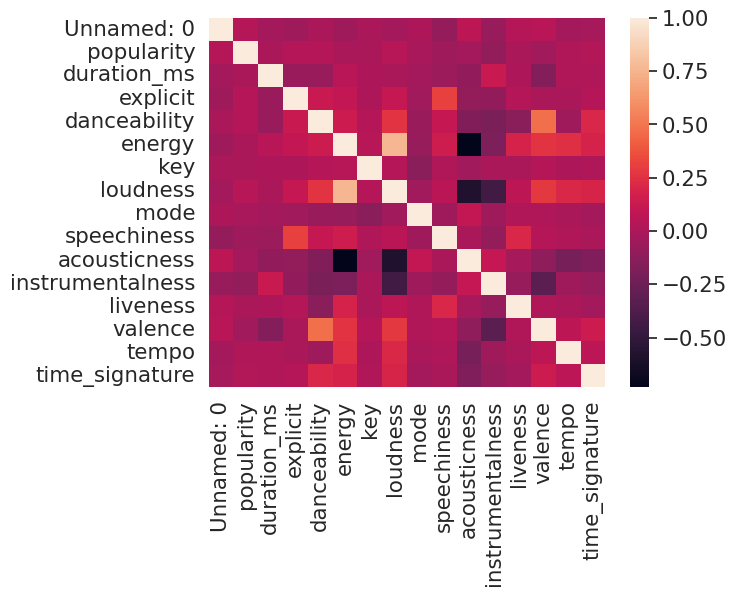

In [ ]:
sns.heatmap(df.corr(numeric_only=True))

The graph above is a correlation heatmap of all the numerical variable in the dataset. We can see that only very few values seem to provide us any signficant correlation coefficient. We can see that energy & loudness seem to have a relatively strong positive correlation, while acousticness & energy, loudness & acousticness, and instrumnetalness & loudness have the relatively strong negative correlations.

# Genre Classification

We want to first see how many genres are in the dataset to start with our classification.

In [ ]:
### provide us with number of genres
df.track_genre.value_counts()

acoustic             1000
afrobeat             1000
psych-rock           1000
progressive-house    1000
power-pop            1000
                     ... 
emo                  1000
electronic           1000
electro              1000
world-music          1000
k-pop                 999
Name: track_genre, Length: 114, dtype: int64

We provided with over 114 different genres to classify our music but for simplicity sake we choose the 5 most popular genres for our classification model.

In [ ]:
#create list of genres we want to use for the classification models
options = ['classical','hip-hop','pop','r-n-b','rock']

# selecting rows based on condition
df = df[df['track_genre'].isin(options)]

### **K-Nearest Neighbors**




The first classification algorithm we will use is the K-nearest neighbors which simply just choose a k number of nearest values to data point and classifies the values based on the most prevelent class in the k nearest values.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris


X = df[['loudness', 'liveness','instrumentalness','valence','tempo','key','energy','explicit','acousticness','speechiness','danceability','popularity','duration_ms']]
y = df['track_genre']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

n = len(y_test)
print(y)

neigh = KNeighborsClassifier(n_neighbors=1)
neigh.fit(X_train, y_train)
ypred=neigh.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
result2 = accuracy_score(y_test,ypred)
print("Accuracy:",result2)

16000    classical
16001    classical
16002    classical
16003    classical
16004    classical
           ...    
91995         rock
91996         rock
91997         rock
91998         rock
91999         rock
Name: track_genre, Length: 5000, dtype: object
Accuracy: 0.507


We obtain a accuracy rate of 50.07% which means that the model is doing better than random guess but still likley can be improved.

**Choosing the k value**

Minimum error:- 0.493 at K = 0


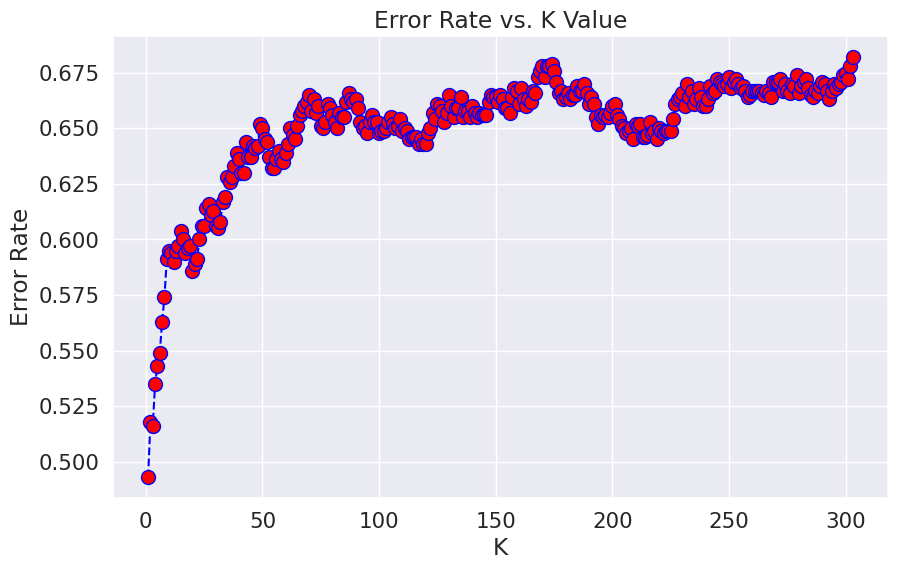

In [ ]:
error_rate = []
for i in range(1,304):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,304),error_rate,color='blue', linestyle='dashed',
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

We calculate the accuracy rate of the k till about the k squared value and plot them against the error rate on a graph. We end up obtaining that our lowest error rate is when k is in fact zero. Due to the high level of error, we will stop here with this model and move onto a different classification model.

### **Decision Tree**
The next model we use is decision trees that models decisions based on a tree-like structure of conditional rules. Each node in the tree represents a decision based on a particular feature, and branches lead to subsequent nodes reflecting different outcomes. The goal is to create a predictive model that efficiently partitions the input space, making it a versatile tool for our genre classification model.

In [ ]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

print("Accuracy:",accuracy_score(y_test, y_pred))

Accuracy: 0.748


We obtain a accuracy rate of 74.8% which is significantly more accurate than the K-nearest neighbors.

**Visualizing the Decision Trees**

In [ ]:
#need to download library to visualize
!pip install six

In [ ]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus
# classifcatio variables used to split the data
cols = ['loudness', 'liveness','instrumentalness','valence','tempo','key','energy','explicit','acousticness','speechiness','danceability','popularity','duration_ms']

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = cols,class_names=options)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('tree.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.82294 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.82294 to fit



The decision tree we get above is very large and hard to really make a grasp of see we reduce the depth of the tree to 5 and make it more visualizable.

In [ ]:
clf = DecisionTreeClassifier(criterion="entropy", max_depth=5)
# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

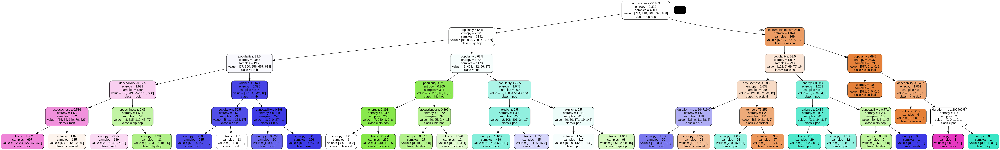

In [ ]:
from six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names = cols,class_names=options)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('test.png')
Image(graph.create_png())

The decision tree is set to a depth of 5 and is now much more visulaizable, so we are able to make more sense of decision trees and split of the variables at each node.

### **Random Forest Trees**

Next, we use the random forest tree model to classify our genre of music. Random Forest is very similar model to decision trees where rather than just having one decision tree it runs through a multitude of trees to reduce overfitting.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import randint


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=8)


param_dist = {'n_estimators': randint(50,500),
              'max_depth': randint(1,20)}

rf = RandomForestClassifier(warm_start=True)
# Use random search to find the best hyperparameters
rand_search = RandomizedSearchCV(rf,
                                 param_distributions = param_dist,
                                 n_iter=5,
                                 cv=5)

# Fit the random search object to the data
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8216


We obtain a accuracy rate of about 82.16% which is better than the classsfication rate we get with the decision tree above.

### **Feature Importance Plot**

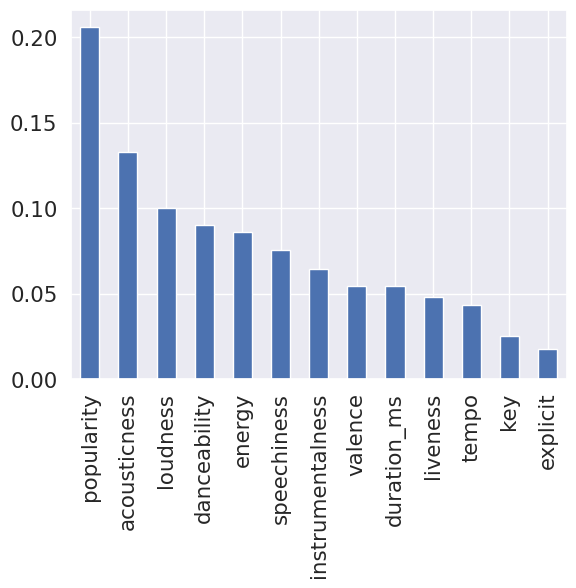

In [ ]:
feature_importances = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_importances.plot.bar();

We plot a feature importance plot which t\ell us which factors we most important in helping with the genre classifcation and which factors were the least. The most useful variables we get are popularity, acousticness, and loudness. The least useful variables we get are tempo, key, and explicit.

**Removing least influential factors**





We drop the least influential variables to see if we can remove them that can reduce overfitting and increase the classifcation rate.

In [ ]:
del df['explicit']
del df['key']
del df['tempo']

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import randint

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=8)


param_dist = {'n_estimators': randint(50,500),
              'max_depth': randint(1,20)}

rf = RandomForestClassifier(warm_start=True)
# Use random search to find the best hyperparameters
rand_search = RandomizedSearchCV(rf,
                                 param_distributions = param_dist,
                                 n_iter=5,
                                 cv=5)

# Fit the random search object to the data
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8376


We obtain a 83.76% accuracy rate which is a slight improvement in the model after dropping some of the factors.

### **Confusion Matrix**




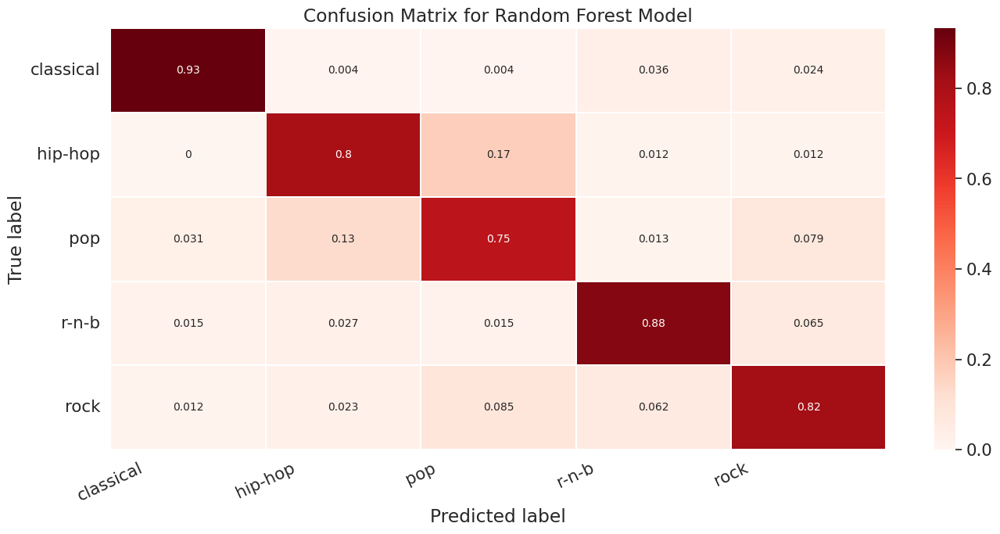

In [ ]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test, y_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Reds, linewidths=0.2)

# Add labels to the plot

tick_marks = np.arange(len(options))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, options, rotation=25)
plt.yticks(tick_marks2, options, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Random Forest Model')
plt.show()



We obtain the following confusion matrix from our decision tree where we can see that the classification rate for the songs that were classical seems to be notably higher at about 93% accuracy and r-n-b at 88% accuracy rate, while pop seems to do poorly compared to the other genres with a 75% classification rate.

# **Conclusion**

Overall, we are able to obtain a maximum accuracy rate at about 83.76% using random forest tree model to predict our song genre using various characteristics of songs from our dataset.